# Part II - San Francisco Bay Area BikeShare: Who are the users?
## by Naomi Ogbechi

## Key Insights for Presentation


For the presentation, I will focus on the notable characteristics i.e. similarities and differences I was able to extract from each feature with regards to the user_type variable. I start by introducing some information regarding the general characteristics of the data, then I introduce the different types of users in the data and introduce plots showing the similarities and differences between the users. 

Recall that there are 2 types of users in the dataset, which include Customers and Subscribers. From [(Wheretraveler.com)](https://www.wheretraveler.com/san-francisco/play/guide-bay-area-bike-share), I learnt that subscribers are residents with annual passes, while customers are visitors with 24-hour passes or three-day passes.

Using a pie chart, I explored the proportion of bike rides by subscribers to that of customers. After which, I checked the gender distribution of subscribers and customers using a bar chart.

In a bid to determine if there were peculiarities to subscribers and customers, I used an overlayed histogram plot to check the age distribution of customers and subscribers.

Furthermore, I used a clustered bar chart to check for trends in the frequency of rides on respective days of the week, I further screened out some days of the week to get a more accurate result.

After checking for trends in the days of the week, I decided to go granular and check the times of day in which most rides were undertaken by customers and subscribers. I did this using a clustered bar chart.

Next, I established the average duration of customer's and subscriber's bikes rides using a 2d bar chart.

In the next phase I explored the popularity of stations around the the San Francisco bay area using plotly's scatter mapbox plot. Then, I highlighted the locations of the most popular stations to observe any patterns.

Finally, Bikeshare for All is a subsidized membership program which makes membership accessible to low-come individuals. It includes trips up to a full hour without redocking [(Sfmta.com)](https://www.sfmta.com/blog/bikeshare-pricing-frequently-asked-questions-faq). Using a 2d bar chart, I decided to explore the usage of the Bikeshare program by subscribers and customers.


## Investigation Overview


In this investigation, I looked at the features which best profile each type of user. The main focus was on gender, age, ride day, ride time, duration and location.


## Dataset Overview


The Ford GoBike system data includes information regarding about 180,000 individual rides made in a bike-sharing system covering the greater San Francisco Bay area in the United States, for the month of February, in the year, 2019. Bikeshare is designed for shorter duration trips. The bike-share system works by circulating—sharing—bikes between users. If a rider needs a bike for longer than 45 minutes, they can always check out a new bike mid-trip to complete their ride.

The Ford GoBike system data provides anonymized observations for rides including features such as the duration in seconds, the start and end station information, the user type; whether subscriber or customer, as well as some demographic information like birth year and gender. All data is based off free material from this [link](https://github.com/BetaNYC/Bike-Share-Data-Best-Practices/wiki/Bike-Share-Data-Systems) which was provided by Udacity.

In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

pio.renderers.default='notebook'

%matplotlib inline

# suppress warnings from final output
import warnings
warnings.simplefilter("ignore")

In [2]:
# Load the cleaned greater San Francisco Bay area dataset into a pandas dataframe
df = pd.read_csv('fordgobike_201902_cleaned.csv')

# Remove trips with age greater than 85
filtered_df = df[df['member_age'] < 85]

# Remove trips with duration greater than 60
filtered_df = filtered_df[filtered_df['duration_mins'] <= 60]

In [3]:
from calendar import day_name as dn
dayofweek = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Create a new column named 'ride_day' and convert column to category data type.
filtered_df['ride_day'] = pd.Categorical(filtered_df['ride_day'], ordered=True, categories=dayofweek)

# Function converts column to category data type.
def to_categorical(df, col):
    
    df[col] = df[col].astype('category')
    
    return df

# Update 'member_gender', 'user_type', 'bike_id' and 'bike_share_for_all_trip' columns using defined function
variables = ['member_gender', 'user_type', 'bike_id', 'bike_share_for_all_trip', 'start_station_name', 'end_station_name']
for i in range(len(variables)):
    var = variables[i]
    to_categorical(filtered_df, var)

In [4]:
# set custom colors
base_color = sns.color_palette()[4]
next_color = sns.color_palette()[6]

# Font settings
fontsize=15
medsize=13

def create_pie(x, labels, ax): # Function creates a pie chart on a specified axis object
    wedges, labels, autopct = ax.pie(x, labels = labels,
                                     colors=[base_color, next_color, 'silver'],
                                     autopct='%1.1f%%', wedgeprops={'linewidth': 0},
                                     startangle = 90, counterclock = False) # Create pie chart
    plt.axis('square') # Square axis
    plt.setp(labels, fontsize=15) # Set chart font size
    plt.setp(autopct, fontsize=15); 
    
def add_title(title, ax): # Function adds a title to a plot made on a specified axis object
    ax.set_title(title, fontdict={'fontsize': fontsize, 'fontweight': 'bold'})
    
def create_clusteredbar(data, x, y, hue, hue_order, order, legend_title, ax): # Function creates a vertical clustered bar chart on a specified axis object
    plt.rc('font', size=fontsize)
    sns.set_context(rc={'patch.linewidth':0.0})
    sns.countplot(data=data, 
                  x=x, 
                  y=y,
                  hue=hue, 
                  palette=  {hue_order[0]:base_color, hue_order[1]:next_color}, 
                  hue_order=hue_order, 
                  order=order, 
                  ax=ax
                 )
    ax.set(xlabel=None, ylabel=None)
    ax.spines[['top', 'bottom', 'right', 'left']].set_visible(False)
    ax.legend(title=legend_title);

def create_heat(data, xlabel, ylabel, ax, cbarlabel, vmin): # Function creates a 2d bar chart on a specified axis object
    sns.heatmap(data, annot=True, fmt='.0f', vmin=vmin, ax=ax, cmap='BuPu', cbar_kws={'label':cbarlabel})
    ax.set(xlabel=xlabel, ylabel=ylabel);
    
def create_hbar(df, column, order, ax): # Function creates a horizontal bar chart on a specified axis object
    plt.rc('font', size=fontsize)
    sns.set_context(rc={'patch.linewidth':0.0})
    sns.countplot(data=df, y=column, color=base_color, order=order, ax=ax)
    ax.bar_label(ax.containers[0], labels=[f'{x:,.0f} trips' for x in ax.containers[0].datavalues])
    ax.set(xlabel=None, xticks=[], ylabel=None)
    ax.spines[['top', 'bottom', 'right', 'left']].set_visible(False);

## How many types of users exist in the dataset and what are they? 

There are 2 types of users in the dataset. They include Customers and Subscribers. Subscribers are residents with annual passes and Customers are visitors with 24-hour passes or three-day passes.[(Wheretraveler.com)](https://www.wheretraveler.com/san-francisco/play/guide-bay-area-bike-share).

## How are the types of users distributed in the dataset?

 Majority of trips were taken by Subscribers. Approximately 1 in every 10 trips, selected at random, was taken by a Customer.

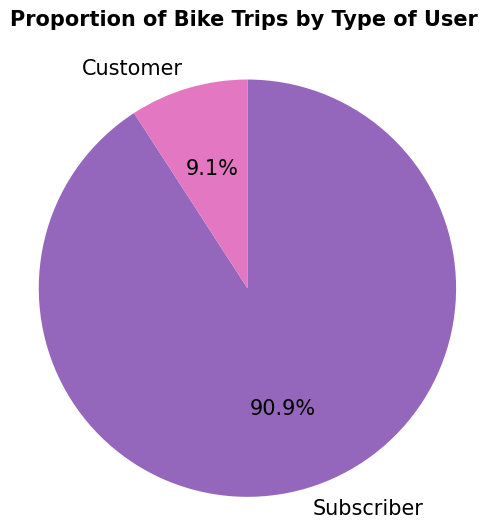

In [5]:
  # Return frequency count for each unique value
count = filtered_df['user_type'].value_counts()
# Get ordered index
type_order = count.index    
    
# Plot pie
fig, ax = plt.subplots(figsize=(12,6))
create_pie(count, type_order, ax)
add_title('Proportion of Bike Trips by Type of User \n', ax)

## What is the distrubution of gender for each type of user?

Majority of bike users in the San Francisco Bay Area are Male and for both user types, Males exceed Females. Most trips were taken by Male users but there were more male subscribers because majority of users are subscribers.

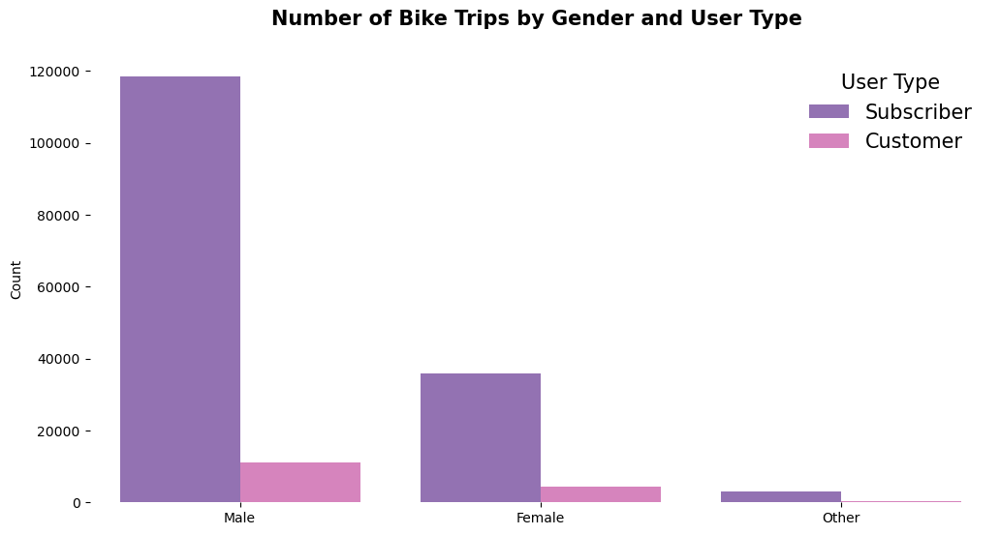

In [6]:
# Return frequency count for each unique value
count = filtered_df['member_gender'].value_counts()
# Get ordered index
g_order = count.index

# Return frequency count for each unique value
count = filtered_df['user_type'].value_counts()
# Get ordered index
type_order = count.index

# Plot clustered bar
fig, ax = plt.subplots(figsize=(12,6))
create_clusteredbar(filtered_df, 'member_gender', None, 'user_type', type_order, g_order, 'User Type', ax)
ax.set_ylabel('Count')
add_title('Number of Bike Trips by Gender and User Type \n', ax)

## What age range has the highest trip frequency for each user type?

The distribution of age for Subscribers is bimodal while that of Customers is unimodal. Majority of trips by both Subscribers and Customers were taken by users within the age range of 25 to 35. Subscribers aged 26 and 31 made the most trips, with age 31 having the largest frequency. For Customers, majority of trips tend to be made by users aged 30. 

In [7]:
# Import necessary packages
import holidays
sfb = holidays.US()
sfb.append({'2019-02-14': 'Valentines Day'})

index = list(filtered_df.index) #  List of row indexes for bike user data

# Create new column with boolean value to check if day is holiday or not
for i in index: 
    filtered_df.loc[i, 'is_holiday'] = filtered_df['start_date'][i] in sfb
    
    
# Remove trips made on holidays from the data
no_holiday = filtered_df[filtered_df['is_holiday'] == False]

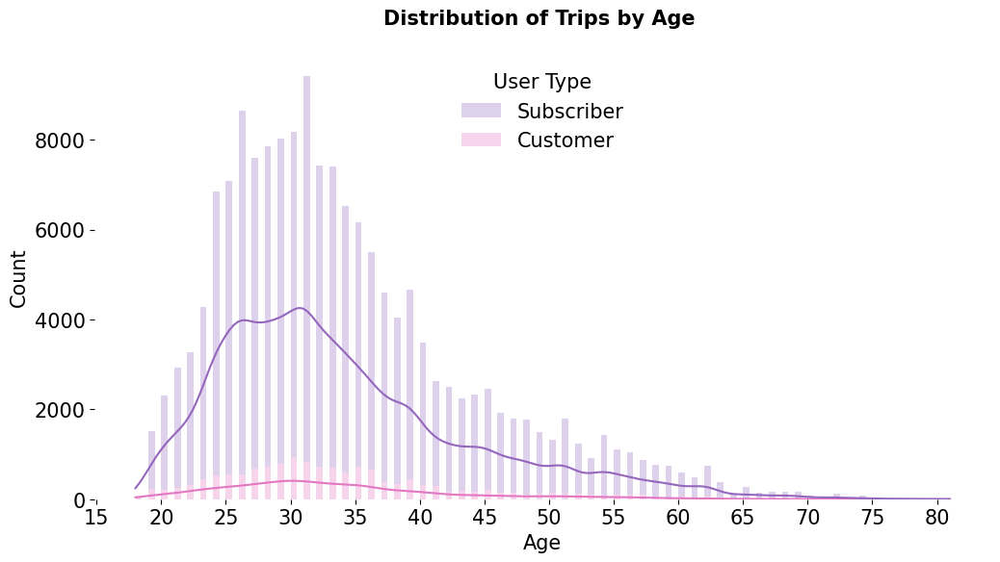

In [8]:
# Set a larger figure size for plot
fig, ax = plt.subplots(figsize=(12,6))

# Create bins with step-size 0.5
max_age = no_holiday['member_age'].max()
min_age = no_holiday['member_age'].min()
bins = np.arange(min_age, max_age + 0.5, 0.5)

# Plot histogram
sns.histplot(data=no_holiday, x='member_age',
             hue='user_type', hue_order=type_order,
             palette={type_order[0]:base_color, type_order[1]:next_color},
             bins=bins, multiple='stack',
             kde=True, alpha=0.3, ax=ax
            )

# Format amd label plot
ax.set(xlabel='Age', xticks=np.arange(15, max_age, 5), ylabel='Count')
ax.spines[['top', 'bottom', 'right', 'left']].set_visible(False)
legend = ax.get_legend()
handles = legend.legendHandles
legend.remove()
ax.legend(handles, ['Subscriber', 'Customer'], title='User Type', loc=9)
add_title('Distribution of Trips by Age \n', ax)

## What is the peak day for trips for each user type?

More trips occurred on a Thursday due to holidays but normally, the days of the week with the highest trip activity for Subscribers and Customers respectively are Tuesday and Friday. Also we can see that Subscribers take less trips on the weekend, i.e. Saturday and Sunday, while Customers have a relatively stable number of trips across the days.

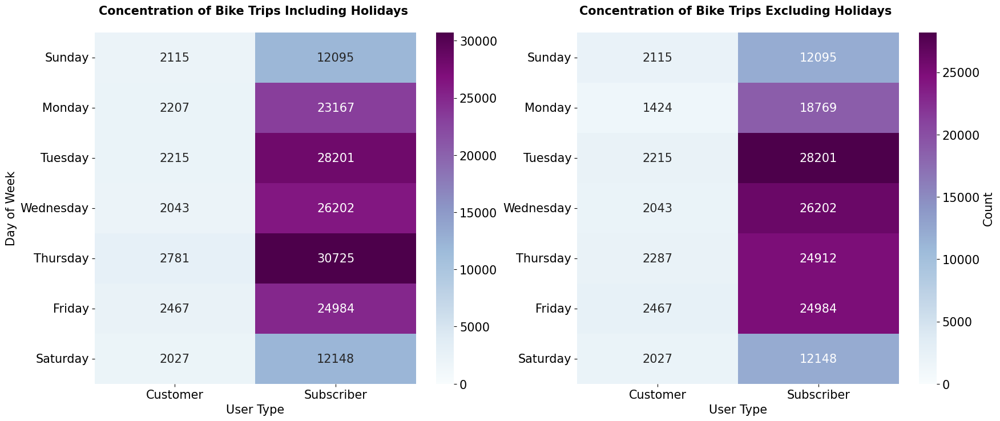

In [9]:
# Create subplots
fig, ax = plt.subplots(ncols=2, figsize=(20,8))

# Get data to plot 2d bar chart
daytype_table= pd.pivot(filtered_df.groupby(['ride_day', 'user_type']).size().reset_index(),
                   index='ride_day', 
                   columns='user_type', 
                   values=0)

# Plot 2d bar chart
create_heat(daytype_table, 'User Type', 'Day of Week', ax[0], None, vmin=0)
add_title('Concentration of Bike Trips Including Holidays \n', ax[0])


# Get data to plot 2d bar chart
daytype_table= pd.pivot(no_holiday.groupby(['ride_day', 'user_type']).size().reset_index(),
                   index='ride_day', 
                   columns='user_type', 
                   values=0)

# Plot 2d bar chart
create_heat(daytype_table, 'User Type', None, ax[1], 'Count', vmin=0)
add_title('Concentration of Bike Trips Excluding Holidays \n', ax[1])

## What is the peak time for trips for each user type?

The distribution of the time of day for both users is bimodal. Subscribers took more trips at 8:00(8am), then the number of trips dropped drastically and then peaked again at 17:00(5pm). On the other hand for customers, although it has a similar distribution to that of subscribers, there are more stable changes. However, the highest peak for subscribers and customers respectively is 8am and 5pm.

In [10]:
# Create new start_hour column
index = no_holiday.index
no_holiday.loc[index, ('start_hour')] = no_holiday.loc[index, 'start_time'].astype(str).str.split(':', expand=True)[0]

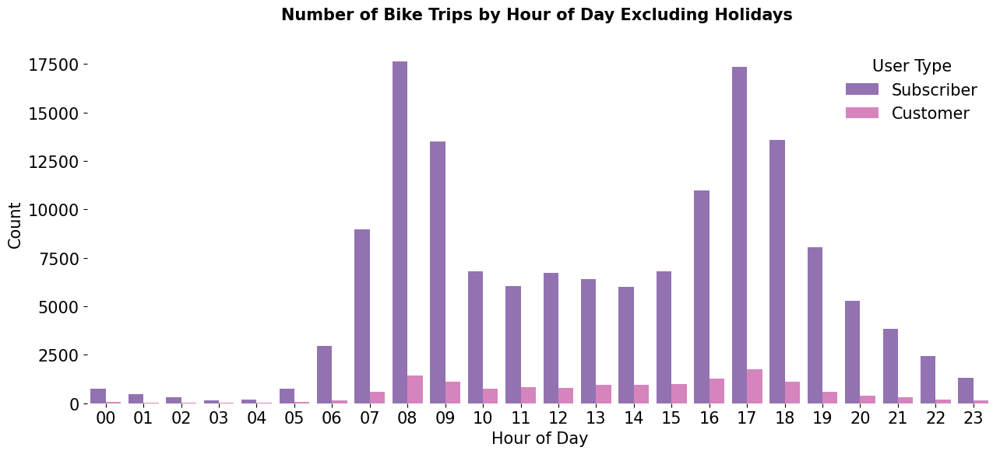

In [11]:
# Set a larger figure size for plot
fig, ax = plt.subplots(figsize=(15,6))

# Groupby 'ride_day' by 'is_holiday' and return frequency count for each unique value
hour_order = no_holiday.groupby('start_hour')['user_type'].size()
# Get ordered index
hour_order = hour_order.index

# Create clustered bar
create_clusteredbar(no_holiday, 'start_hour', None, 'user_type', type_order, hour_order, 'User Type', ax=ax)
ax.set(xlabel='Hour of Day', ylabel='Count')
add_title('Number of Bike Trips by Hour of Day Excluding Holidays \n', ax)

## Do any noticeable trends exist in the the relationship between duration and time of day for the different user types?

Customers generally take longer trips than subscribers. The line for customers is turbulent and there are three(3) peaks with the highest having a duration of about 18 minutes at 13:00(1pm) in the afternoon. On the other hand, the subscriber duration for each hour of the day is relatively consistent with no visible peaks.

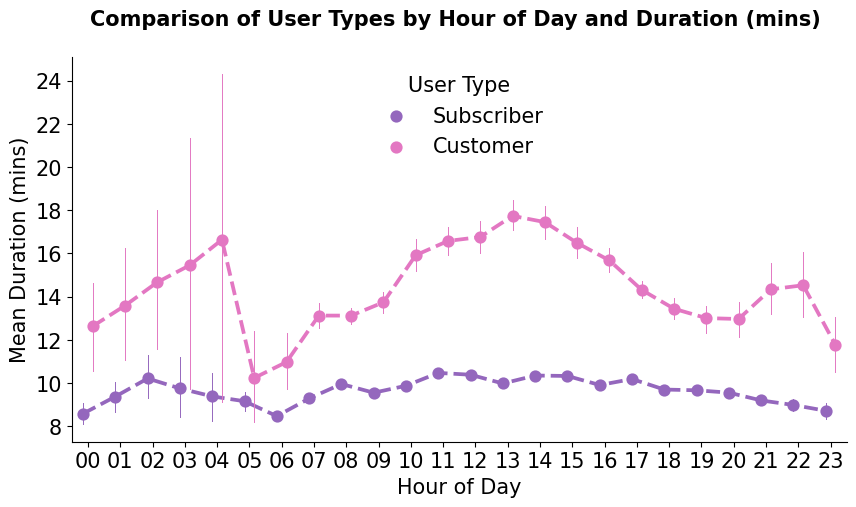

In [12]:
# Set a larger figure size for plot
fig, ax = plt.subplots(figsize=(10,5))

# Create point plot
sns.pointplot(data = no_holiday, 
              x = 'start_hour', y = 'duration_mins', 
              hue = 'user_type', hue_order=type_order, order=hour_order,
              palette={'Subscriber':base_color, 'Customer':next_color}, 
              dodge = 0.3, linestyles = "--", errwidth=0.7, ax=ax
             )

# Format amd label plot
ax.set(xlabel='Hour of Day', ylabel='Mean Duration (mins)')
ax.legend(loc=9, framealpha = 1, title = 'User Type')
ax.spines[['top', 'right']].set_visible(False);
add_title('Comparison of User Types by Hour of Day and Duration (mins) \n', ax)

## What are the top stations for users? 

The Powell St BART station is the most visited and most popuplar station for bike user trips. Also, the top 10 start stations and the top 10 end stations are the same albeit with some fluctuations in position.

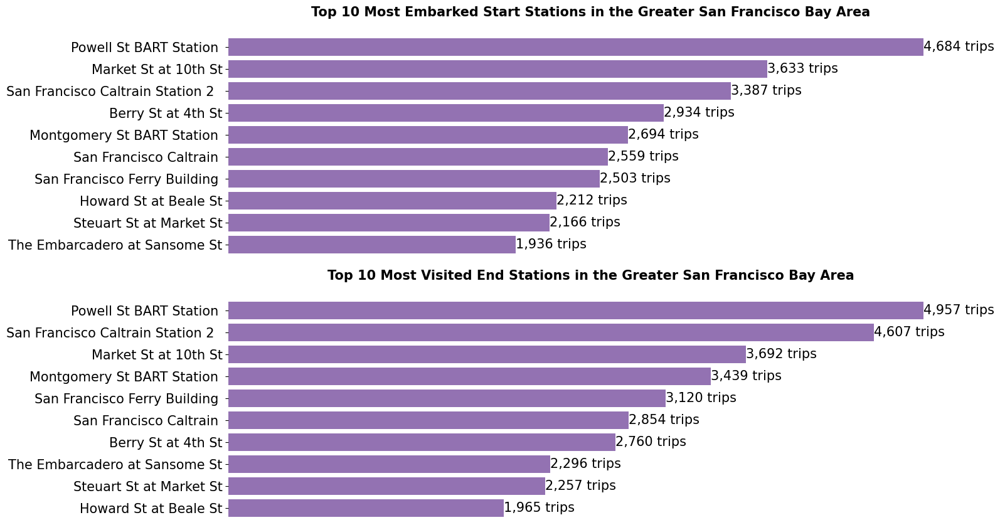

In [13]:
# Create subplots
fig, ax = plt.subplots(nrows=2, figsize=(15,10))

# Top Plot
# Get first 10 start stations in descending order of frequency
count = filtered_df['start_station_name'].value_counts().head(10)
# Get ordered index
station_order = count.index

# Plot horizontal bar
create_hbar(filtered_df, 'start_station_name', station_order, ax=ax[0])
add_title('Top 10 Most Embarked Start Stations in the Greater San Francisco Bay Area \n', ax[0])


# Bottom Plot
# Get first 10 end stations in descending order of frequency
count = filtered_df['end_station_name'].value_counts().head(10)
# Get ordered index
station_order = count.index

# Plot horizontal bar
create_hbar(filtered_df, 'end_station_name', station_order, ax=ax[1])
add_title('Top 10 Most Visited End Stations in the Greater San Francisco Bay Area \n', ax[1])

## Which station, from the top 10 stations, do each type of user type utilize more?

The postion of station changes based on the users. Although both subscribers and customers utilize the Powell St BART station more than other stations, the next option of station for subscribers and cusomers vary. Customers would rather use the station at the San Francisco Ferry Building as a second choice for trips while subscribers use the Market St at 10th St station.

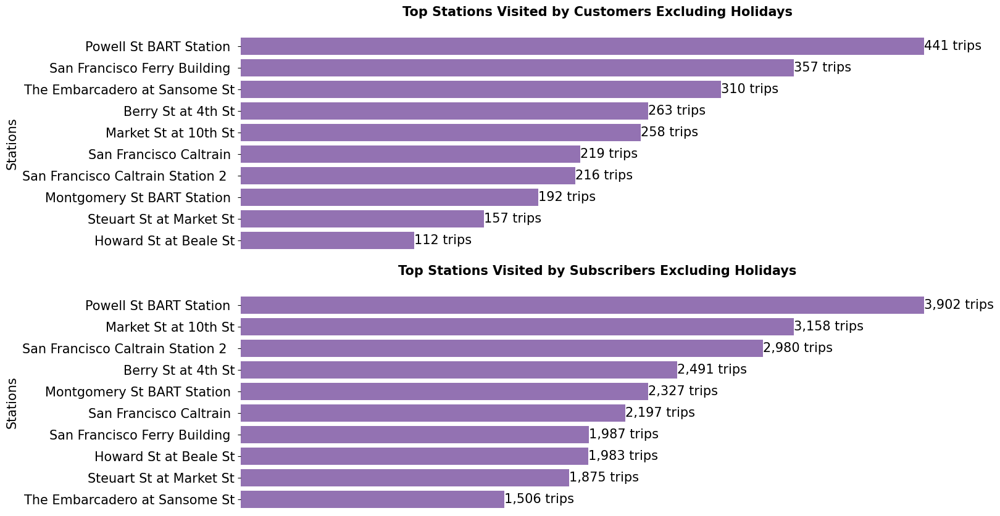

In [14]:
# Create subplots
fig, ax = plt.subplots(nrows=2, figsize=(15,10))

# Get first 10 start stations in descending order of frequency
count = no_holiday['start_station_name'].value_counts().head(10)
# Get ordered index
topstations = list(count.index[:10])

# Select only trips that occurred in the top 10 stations
top = no_holiday[no_holiday['start_station_name'].isin(topstations)]


# Select only Customers
top_stations_c = top[top['user_type'] == 'Customer'] 
count = top_stations_c['start_station_name'].value_counts().head(10)
order = count.index

# Plot horizontal bar
create_hbar(top_stations_c, 'start_station_name', order, ax[0])
ax[0].set(ylabel='Stations')
add_title('Top Stations Visited by Customers Excluding Holidays \n', ax[0])


# Select only Subscribers
top_stations_s = top[top['user_type'] == 'Subscriber'] 
count = top_stations_s['start_station_name'].value_counts().head(10)
order = count.index

# Plot horizontal bar
create_hbar(top_stations_s, 'start_station_name', order, ax[1])
ax[1].set(ylabel='Stations')
add_title('Top Stations Visited by Subscribers Excluding Holidays \n', ax[1])

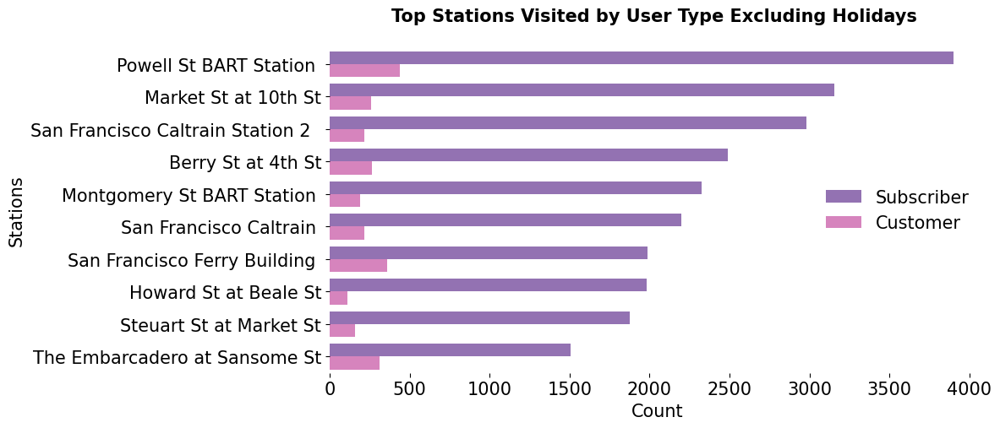

In [15]:
# Set a larger figure size for plot
fig, ax = plt.subplots(figsize=(10,5))

# Plot both subscribers and customers in a horizontal clustered bar
create_clusteredbar(top, None, 'start_station_name', 'user_type', type_order, topstations, 'User Type', ax)
ax.legend(loc=5);
ax.set(xlabel='Count', ylabel='Stations')
add_title('Top Stations Visited by User Type Excluding Holidays \n', ax)

## How are the top stations distributed?

The stations are gathered in three clusters; one in Oakland, one in San Francisco and the last one in San Jose. Hence, the stations in the San Francisco bay area consists of stations in the cities; Oakland, San Francisco and San Jose. The top stations which both customers and subscribers use are particularly concentrated in the eastern part of San Francisco and are located in the same area. 

In [16]:
# Get only top stations; name, latitude and longitude
count = filtered_df['start_station_name'].value_counts().head(10)
stations = count.reset_index(name='trips')
stations.rename(columns={'index':'start_station_name'}, inplace=True)
lat_lon = filtered_df[['start_station_name','start_station_latitude', 'start_station_longitude', 'user_type']]
add = lat_lon.groupby('start_station_name')[['start_station_latitude', 'start_station_longitude']].first().reset_index()
top_stations = pd.merge(stations, add, on='start_station_name', how='left')

In [17]:
# Create mapbox object and plot station points
# Outer points for all stations
fig = px.scatter_mapbox(
    no_holiday,  # Our DataFrame
    lat='start_station_latitude',
    lon='start_station_longitude',
    center={"lat": 37.786375, "lon": -122.404904},  # Map will be centered on Powell St BART Station 
    width=900,  # Width of map
    height=600,  # Height of map
    zoom=7.5,
    mapbox_style="carto-positron",
    hover_name='start_station_name',
    hover_data={'start_station_latitude':False, 'start_station_longitude':False},
    title=f'<b>Distribution of Stations in San Francisco Bay Area<b>'
)

fig.update_traces(showlegend=True, legendgrouptitle=dict(text='User Type'), 
                  marker=dict(size=20, color='MediumPurple', opacity=0.1)
                 )
fig['data'][0]['name']='Stations'

# Smaller points denote top stations
fig.add_trace(go.Scattermapbox(
    lat=top_stations['start_station_latitude'],
    lon=top_stations['start_station_longitude'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=10,
        color='Fuchsia',
        opacity=0.8),
    name='Top Station',
    text=top_stations['start_station_name'],
    hoverinfo='text' # Display station name when hovering mouse over point
    ))

In [18]:
# Create mapbox object and plot station points
# Create bigger point
fig = px.scatter_mapbox(
    top_stations,  # Our DataFrame
    lat='start_station_latitude',
    lon='start_station_longitude',
    center={"lat": 37.786375, "lon": -122.404904},  # Map will be centered on Powell St BART Station 
    width=900,  # Width of map
    height=600,  # Height of map
    zoom=12,
    mapbox_style="carto-positron",
    title=f'<b>Distribution of Top Stations in San Francisco Bay Area<b>'
)

fig.update_traces(marker=dict(size=20, color='Fuchsia', opacity=0.3)
                 )

station_name = list(top_stations['start_station_name'])
stations_data = {station:top_stations.query("start_station_name == '%s'" %station)
                              for station in station_name}

# Create smaller point
fig.add_trace(go.Scattermapbox(
    lat=top_stations['start_station_latitude'],
    lon=top_stations['start_station_longitude'],
    mode='markers+text',
    name="",
    customdata=top_stations['start_station_name'],
    showlegend=False,
    marker=go.scattermapbox.Marker(
        size=10,
        color='Fuchsia',
        opacity=0.5),
    text=top_stations['trips'],
    hovertemplate="<b>%{customdata}</b><br><br>" + "No. of Trips: %{text:,.0f}<br>" # Display station name when hovering mouse over point
)
             )
    
fig.show()

## Bike Share For All

Bikeshare for All is a subsidized membership program which makes membership accessible to low-come individuals. It includes trips up to a full hour without redocking [(Sfmta.com)](https://www.sfmta.com/blog/bikeshare-pricing-frequently-asked-questions-faq). About 10% of trips were taken by users with the bikeshare for all membership. Only Subscribers are enrolled in the bikeshare for all program

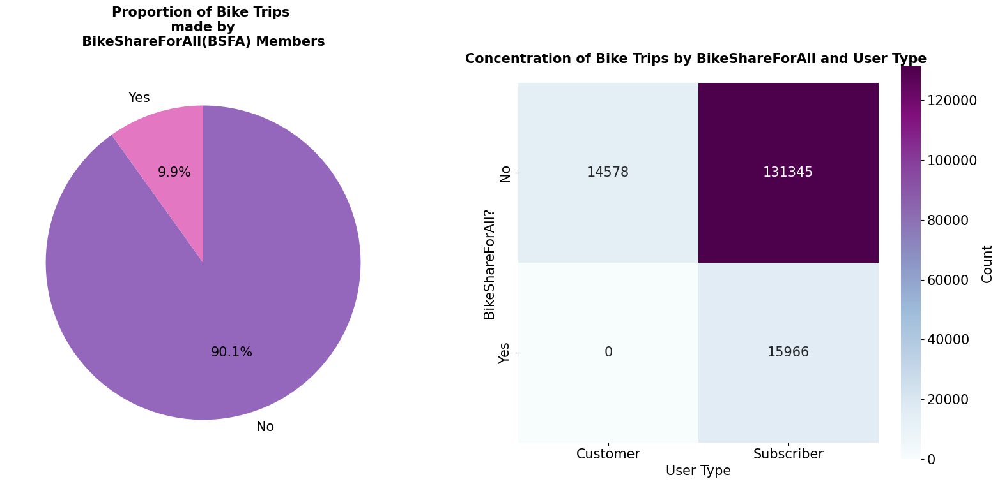

In [19]:
# Create subplots
fig, ax = plt.subplots(ncols=2, figsize=(20,8))

# Left Plot
# Return frequency count for each unique value
count = filtered_df['bike_share_for_all_trip'].value_counts()

# Plot pie
create_pie(count, count.index, ax[0])
add_title('Proportion of Bike Trips \n made by \n BikeShareForAll(BSFA) Members \n', ax[0])


# Right Plot
# Get data to plot 2d bar chart
sharedtype_table= pd.pivot(no_holiday.groupby(['bike_share_for_all_trip', 'user_type']).size().reset_index(),
                   index='bike_share_for_all_trip', 
                   columns='user_type', 
                   values=0)

# Plot 2d bar chart
create_heat(sharedtype_table, 'User Type', 'BikeShareForAll?', ax[1], 'Count', vmin=0)
add_title('Concentration of Bike Trips by BikeShareForAll and User Type \n', ax[1])

### Do any noticeable trends exist in the the relationship between the age and bikeshareforall for the different user types?

Subscribers who are not bikeshareforall members tend to be older than those who are. 

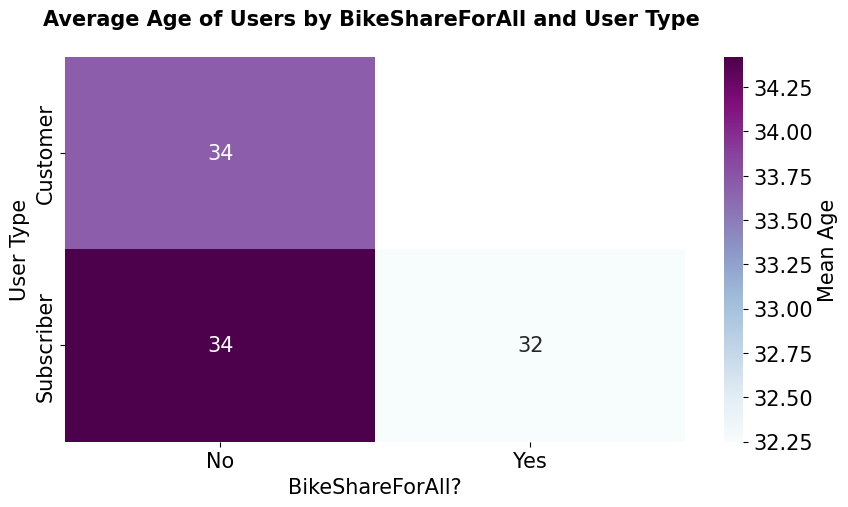

In [20]:
# Set a larger figure size for plot
fig, ax = plt.subplots(figsize=(10,5))

# Get data to plot 2d bar chart
cat_means = (no_holiday.groupby(['bike_share_for_all_trip', 'user_type'])
             .mean()['member_age']
             .reset_index(name = 'member_age')
            )
cat_means = cat_means.pivot(index = 'user_type', columns = 'bike_share_for_all_trip',
                            values = 'member_age')

# Plot 2d bar chart
create_heat(cat_means, 'BikeShareForAll?', 'User Type', ax, 'Mean Age', vmin=None)
add_title('Average Age of Users by BikeShareForAll and User Type \n', ax)

### Do any noticeable trends exist in the the relationship between the trip duration and bikeshareforall for the different user types?

The average duration of subscribers does not appear to be impacted by the bikeshareforall membership.

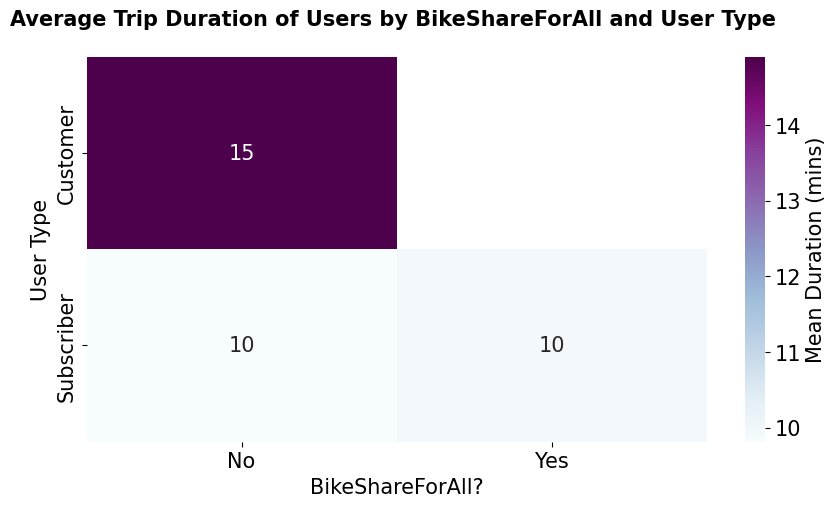

In [21]:
# Set a larger figure size for plot
fig, ax = plt.subplots(figsize=(10,5))

# Get data to plot 2d bar chart
cat_means = (no_holiday.groupby(['bike_share_for_all_trip', 'user_type'])
             .mean()['duration_mins']
             .reset_index(name = 'duration_mins')
            )
cat_means = cat_means.pivot(index = 'user_type', columns = 'bike_share_for_all_trip',
                            values = 'duration_mins')

# Plot 2d bar chart
create_heat(cat_means, 'BikeShareForAll?', 'User Type', ax, 'Mean Duration (mins)', vmin=None)
add_title('Average Trip Duration of Users by BikeShareForAll and User Type \n', ax)

In [23]:
!jupyter nbconvert Part_II_-_Ford_GoBike_Data_Explanatory_Notebook_by_Naomi_Ogbechi.ipynb --to slides --post serve --no-input --no-prompt

[NbConvertApp] Converting notebook Part_II_-_Ford_GoBike_Data_Explanatory_Notebook_by_Naomi_Ogbechi.ipynb to slides
[NbConvertApp] Writing 19053438 bytes to Part_II_-_Ford_GoBike_Data_Explanatory_Notebook_by_Naomi_Ogbechi.slides.html
[NbConvertApp] Redirecting reveal.js requests to https://cdnjs.cloudflare.com/ajax/libs/reveal.js/3.5.0
Traceback (most recent call last):
  File "C:\Users\HP\.conda\envs\project_three\Scripts\jupyter-nbconvert-script.py", line 10, in <module>
    sys.exit(main())
  File "C:\Users\HP\.conda\envs\project_three\lib\site-packages\jupyter_core\application.py", line 269, in launch_instance
    return super().launch_instance(argv=argv, **kwargs)
  File "C:\Users\HP\.conda\envs\project_three\lib\site-packages\traitlets\config\application.py", line 846, in launch_instance
    app.start()
  File "C:\Users\HP\.conda\envs\project_three\lib\site-packages\nbconvert\nbconvertapp.py", line 369, in start
    self.convert_notebooks()
  File "C:\Users\HP\.conda\envs\project